In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [26]:
train = pd.read_csv("../data/train.csv")
train["date"] = pd.to_datetime(train["date"])
test = pd.read_csv("../data/test.csv")
oil = pd.read_csv("../data/oil.csv")  ## 오일 가격??
oil["date"] = pd.to_datetime(oil["date"])
holidays_events = pd.read_csv("../data/holidays_events.csv") ## 공휴일 정보
stores = pd.read_csv("../data/stores.csv") ## store_nbr 에 대한 정보
transactions = pd.read_csv("../data/transactions.csv") ## 거래량?

In [27]:
train["date"] = pd.to_datetime(train["date"])
test["date"] = pd.to_datetime(test["date"])
holidays_events["date"] = pd.to_datetime(holidays_events["date"])
oil["date"] = pd.to_datetime(oil["date"])

In [28]:
# from sklearn.preprocessing import MinMaxScaler

# ms = MinMaxScaler()
# train[["sales", "onpromotion"]] = ms.fit_transform(train[["sales", "onpromotion"]])

## method1
  onpromotion이 0일 때와 0이 아닐 때를 구분해서 학습하고 결과 저장

In [37]:
len(train["store_nbr"].unique())

54

In [ ]:
(pd.Timestamp("2013-01-01"), pd.Timestamp("2013-08-15"), pd.Timestamp("2013-08-16"), pd.Timestamp("2013-08-31"))

In [47]:
_ = train[(train["date"] >= pd.Timestamp("2013-01-01")) & (train["date"] <= pd.Timestamp("2013-08-15"))]

In [56]:
non = _[_["onpromotion"] != 0]
if non.empty:

IndentationError: expected an indented block (3155187765.py, line 2)

In [40]:

train[train["onpromotion"] != 0].describe()
train[train["onpromotion"] == 0].describe()


,id,date,store_nbr,sales,onpromotion
count,2.389559e+06,2389559,2.389559e+06,2.389559e+06,2389559.0
mean,1.325938e+06,2015-01-16 04:01:21.323792640,2.742011e+01,1.582467e+02,0.0
min,0.000000e+00,2013-01-01 00:00:00,1.000000e+00,0.000000e+00,0.0
25%,5.973895e+05,2013-12-02 00:00:00,1.400000e+01,0.000000e+00,0.0
50%,1.248352e+06,2014-12-03 00:00:00,2.700000e+01,3.000000e+00,0.0
75%,2.004256e+06,2016-02-02 00:00:00,4.100000e+01,5.400000e+01,0.0
max,3.000887e+06,2017-08-15 00:00:00,5.400000e+01,8.957636e+04,0.0
std,8.419950e+05,NaN,1.547789e+01,6.148945e+02,0.0


In [38]:
for nbr in train["store_nbr"].unique():
    one = train[train["store_nbr"] == nbr]
    print(f"##      {nbr}")
    print(one[one["onpromotion"] != 0]["sales"].describe())

##      1
count    11909.000000
mean       721.027741
std        951.924145
min          1.000000
25%        108.139000
50%        229.000000
75%        843.000000
max       9065.000000
Name: sales, dtype: float64
##      10
count     9591.000000
mean       556.584831
std        826.731588
min          1.000000
25%         88.000000
50%        209.048000
75%        648.000000
max      10801.000000
Name: sales, dtype: float64
##      11
count    11565.000000
mean      1540.426167
std       2277.626438
min          1.000000
25%        108.565000
50%        547.000000
75%       1766.000000
max      20891.557000
Name: sales, dtype: float64
##      12
count     8945.000000
mean       639.754419
std        917.204213
min          1.000000
25%         98.000000
50%        222.000000
75%        688.000000
max      11609.557000
Name: sales, dtype: float64
##      13
count    9155.000000
mean      625.882277
std       981.714289
min         1.000000
25%        85.061500
50%       183.418000
75% 

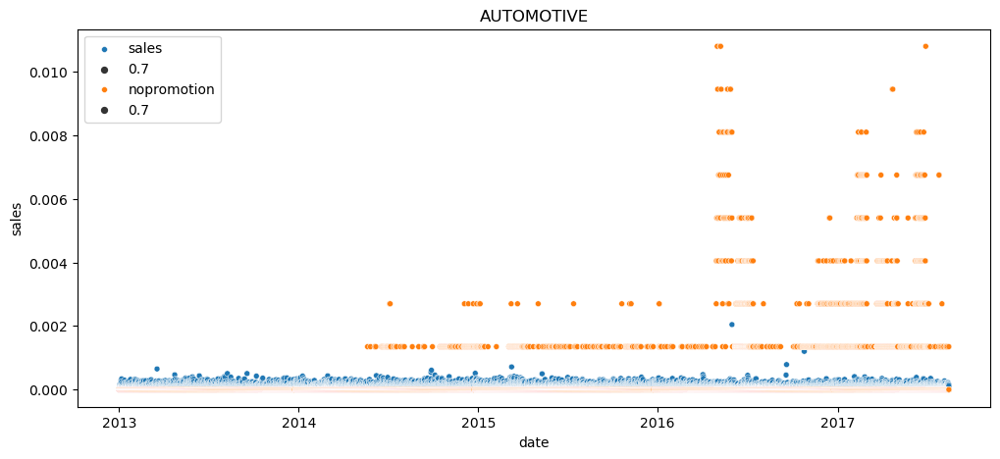

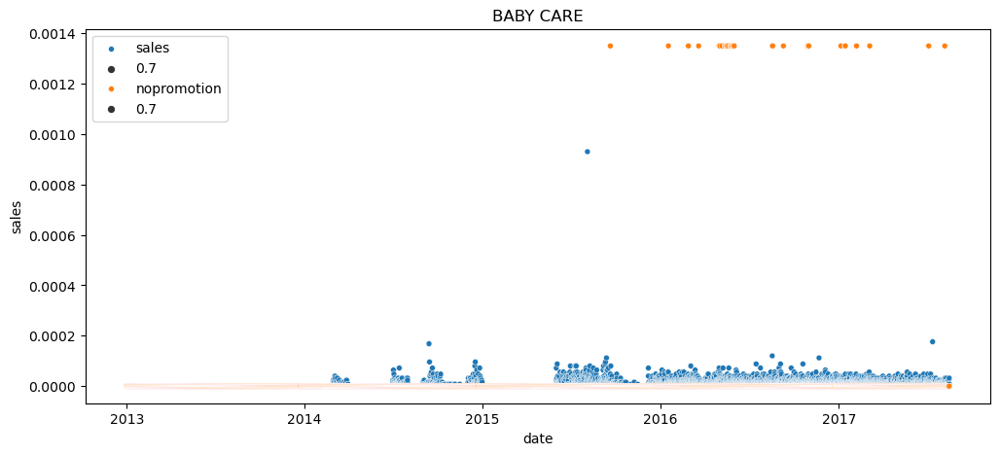

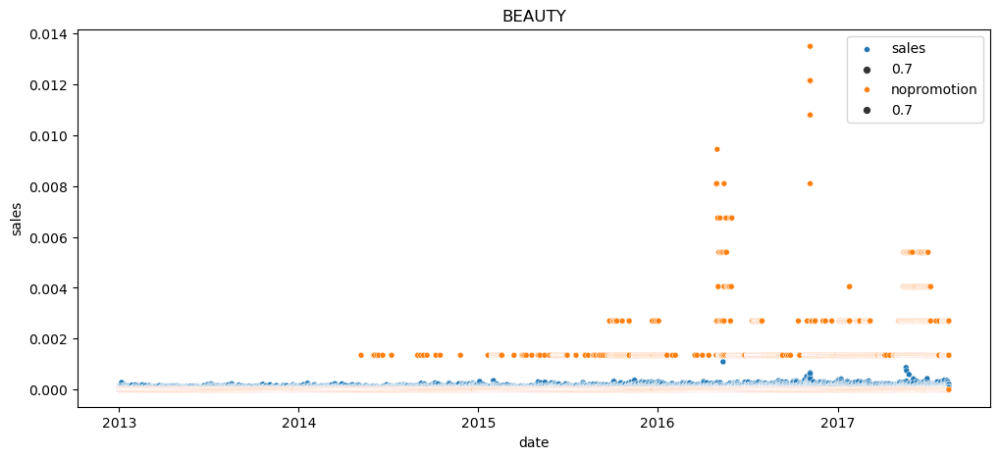

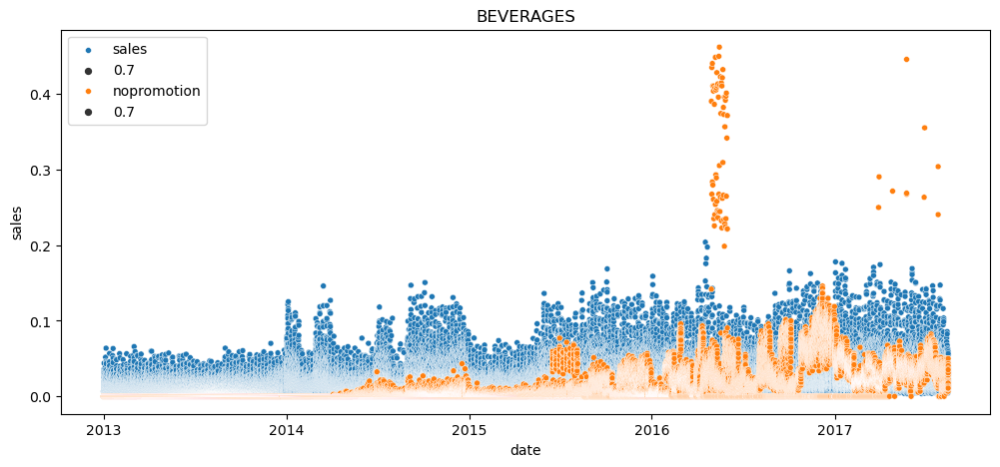

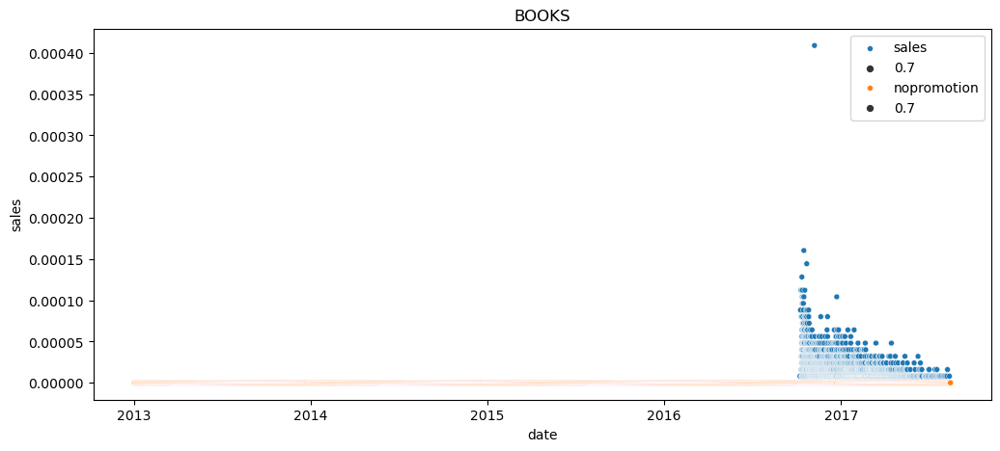

...

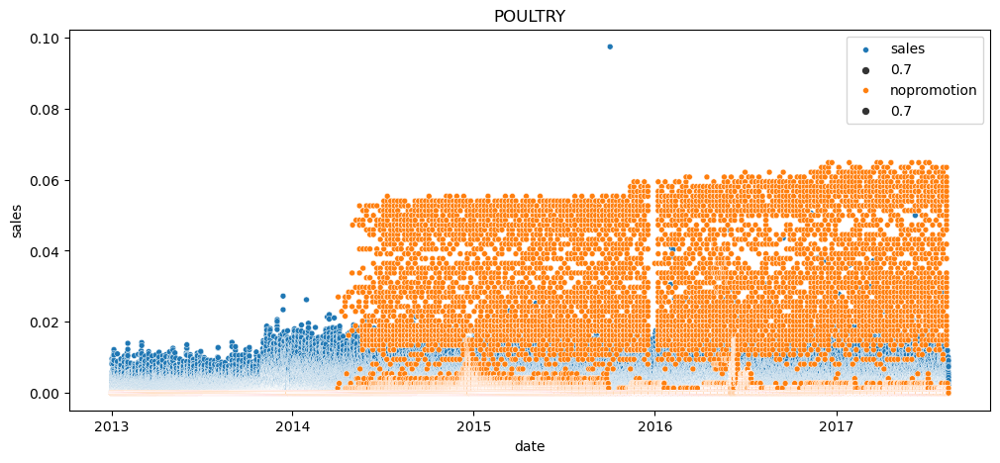

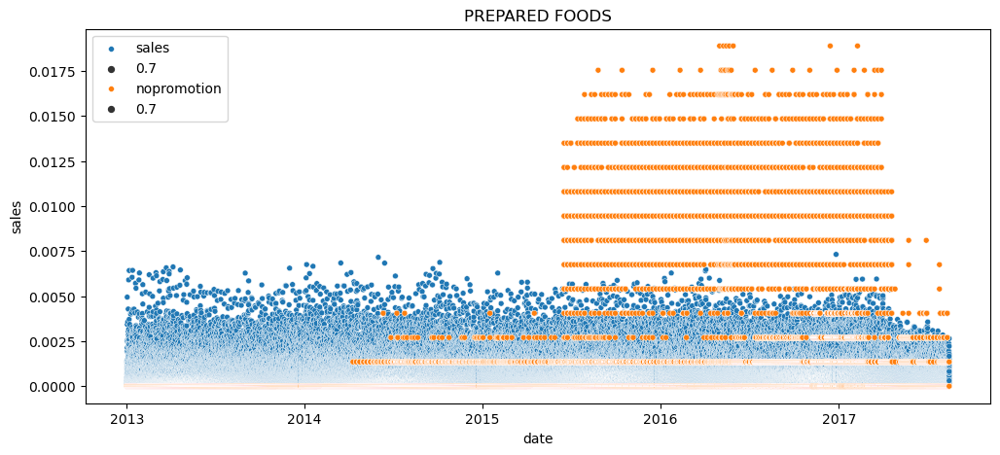

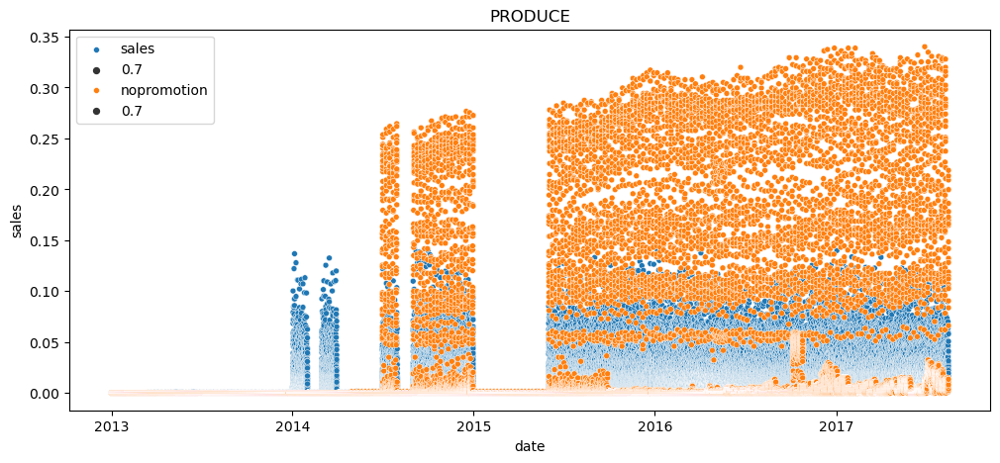

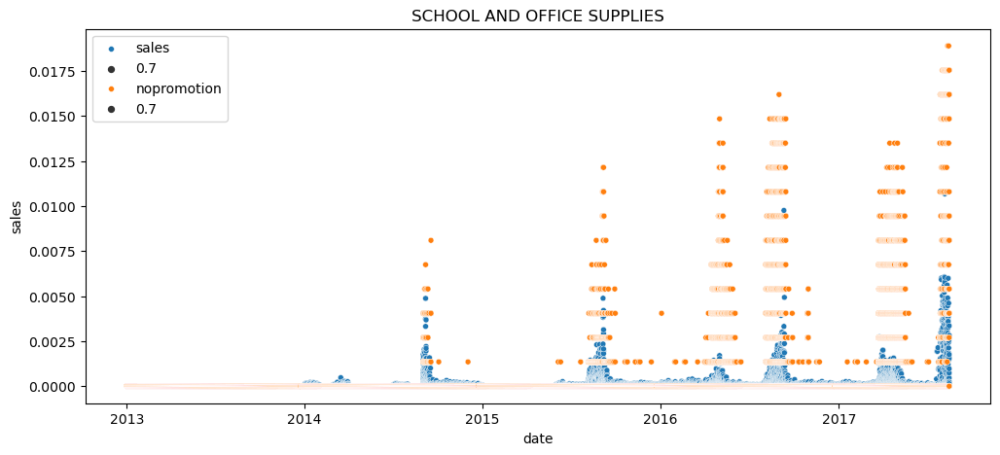

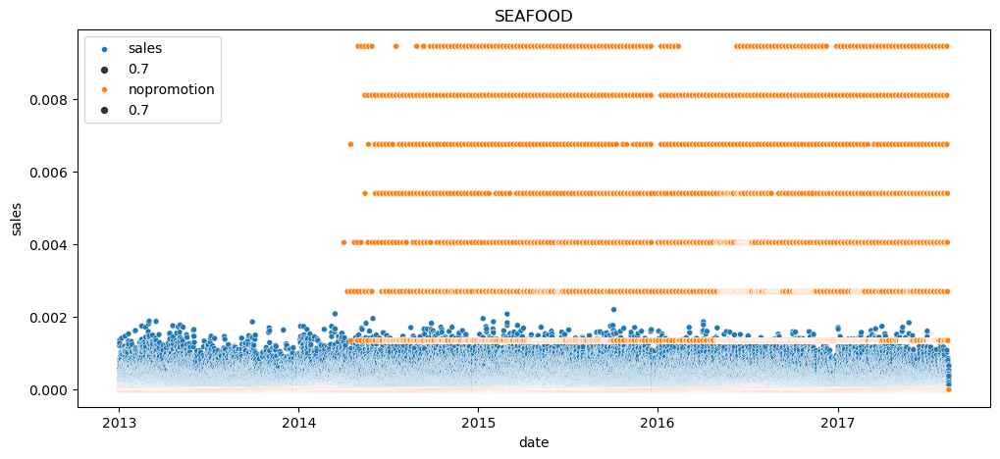

In [22]:
for fl in train["family"].unique():
    one = train[train["family"] == fl]
    plt.figure(figsize=(12,5))
    sns.scatterplot(one, x="date", y="sales", size=0.7, label="sales")
    sns.scatterplot(one, x="date", y="onpromotion", size=0.7, label="nopromotion")
    plt.title(f"{fl}")
    plt.show()

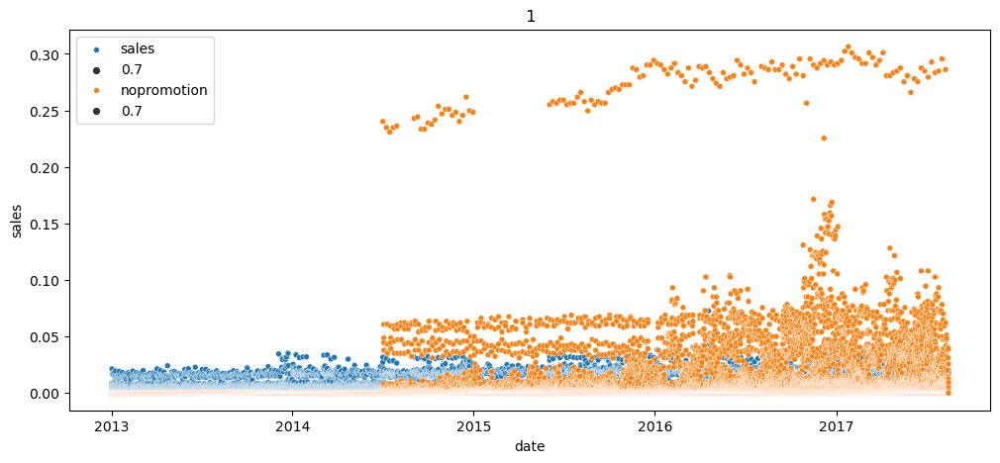

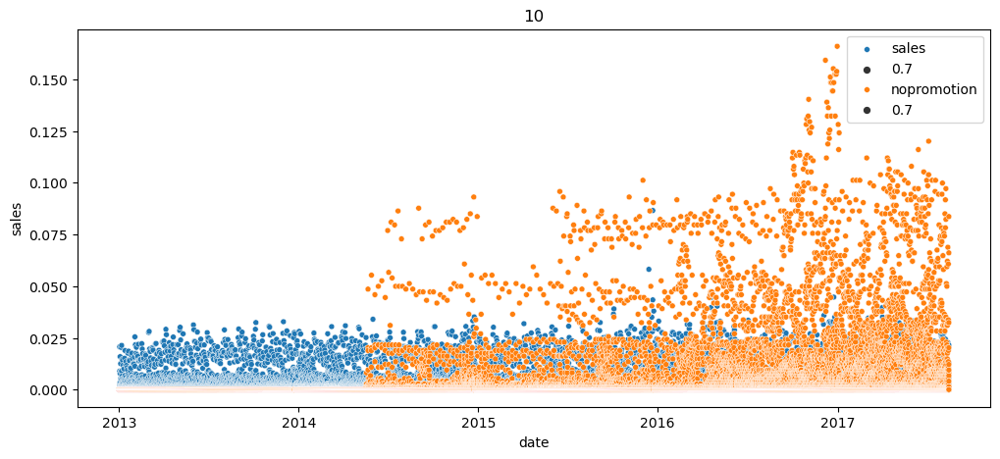

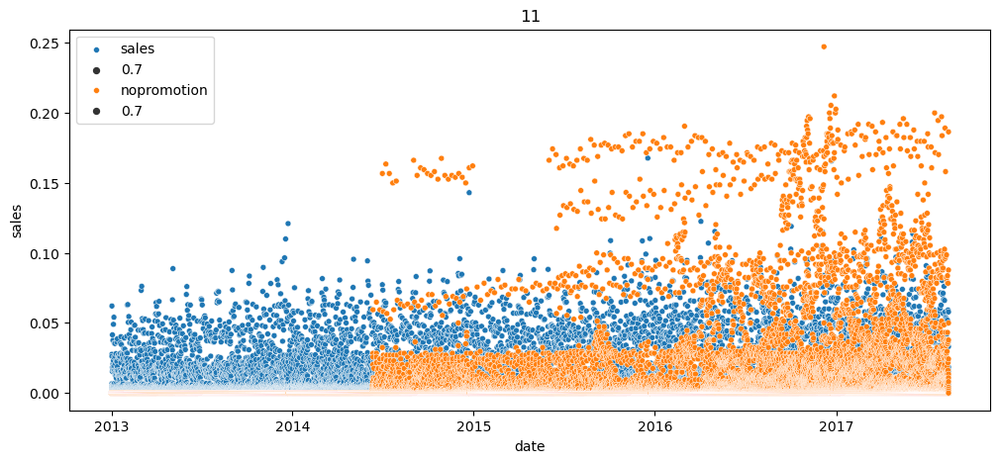

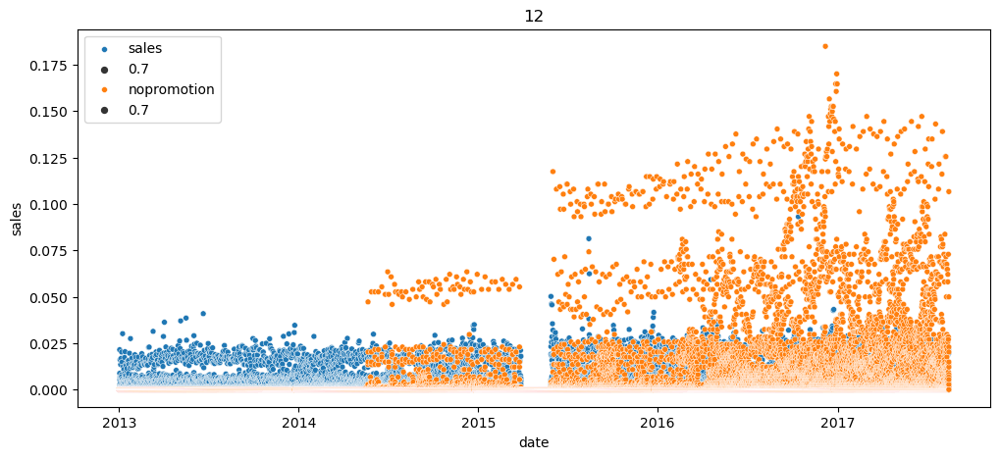

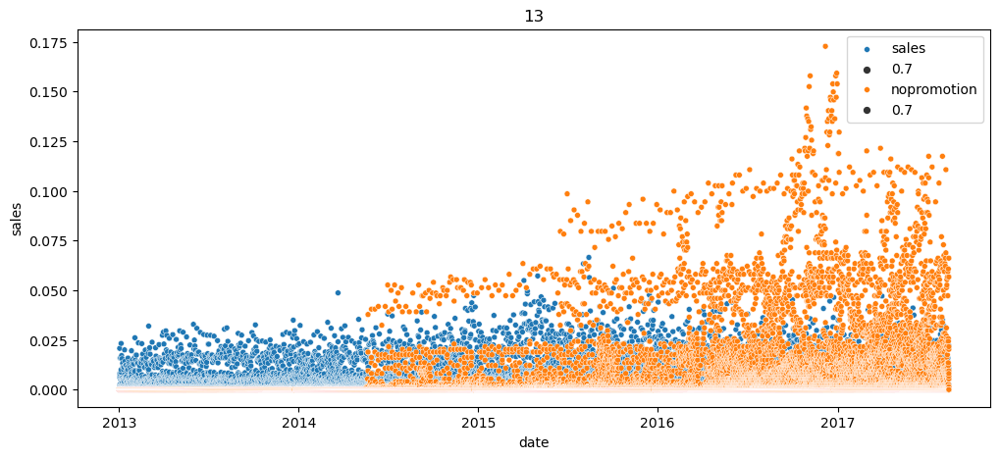

...

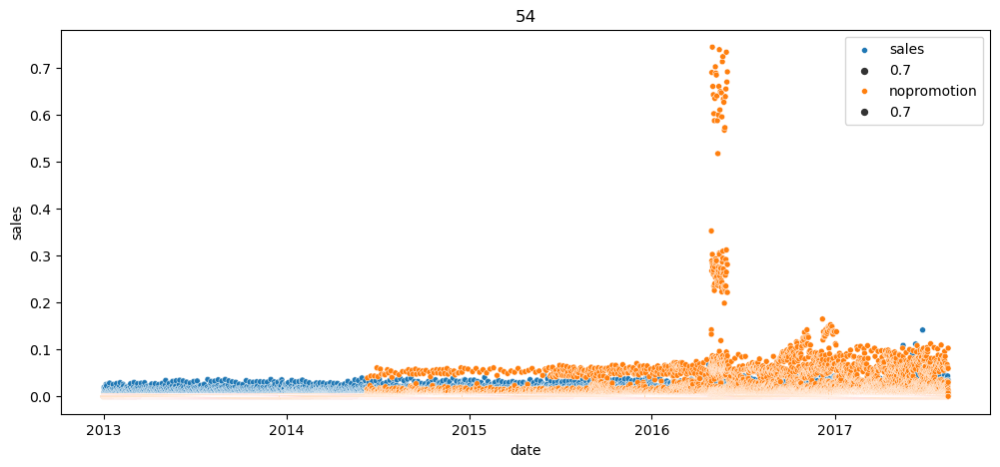

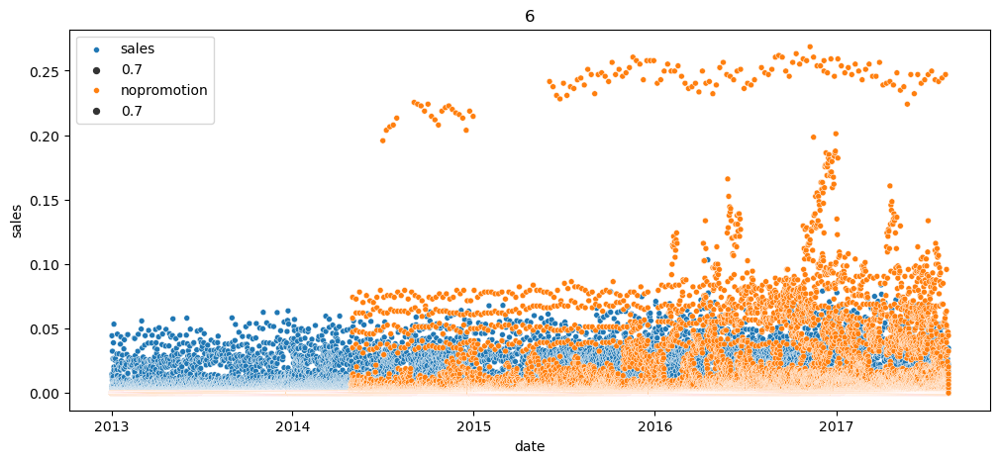

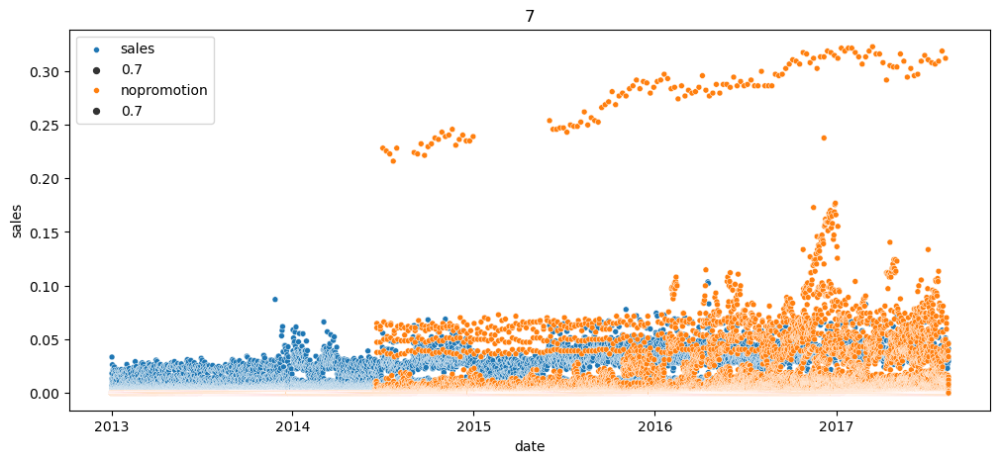

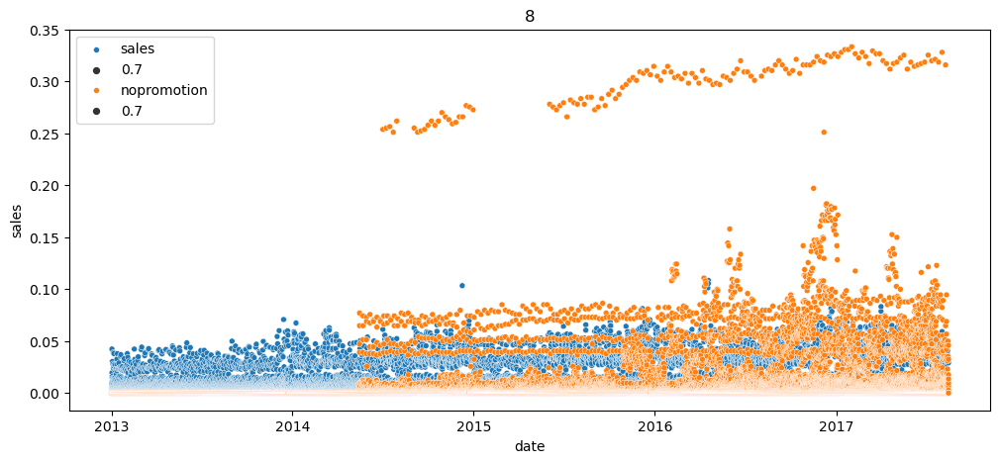

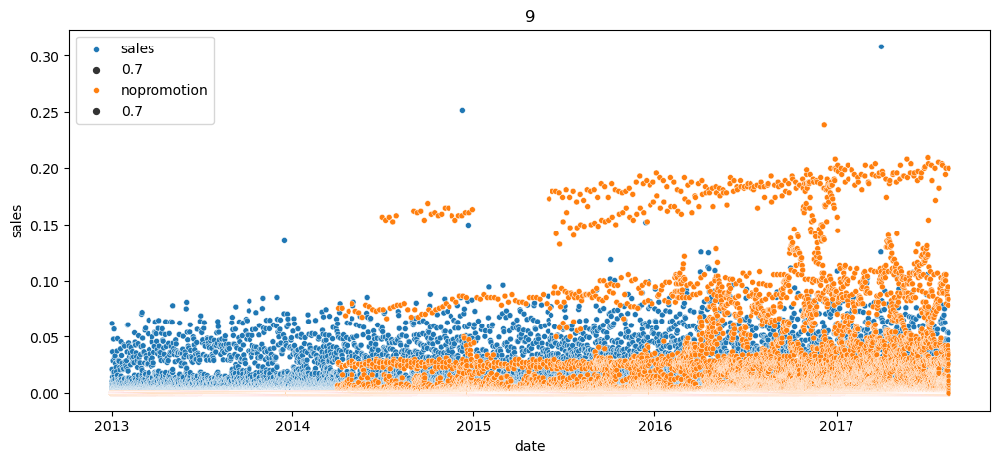

In [23]:
for nbr in train["store_nbr"].unique():
    one = train[train["store_nbr"] == nbr]
    plt.figure(figsize=(12,5))
    sns.scatterplot(one, x="date", y="sales", size=0.7, label="sales")
    sns.scatterplot(one, x="date", y="onpromotion", size=0.7, label="nopromotion")
    plt.title(f"{nbr}")
    plt.show()